# Portfolio Optimisation

In [89]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from collections import defaultdict
import re

In [14]:
# List of stock tickers
tickers = ["FNZ.NZ", "DIV.NZ", "MDZ.NZ", "EMF.NZ", "USF.NZ", "APA.NZ", "EUF.NZ"]

# Time period
start_date = pd.Timestamp.now() - pd.DateOffset(years=10)
end_date = pd.Timestamp.now()

def get_stock_data(tickers,
                   start_date,
                   end_date):
    """
    Get stock data from Yahoo Finance.
    """

    # Initialize dictionaries to store data
    closing_prices = {}
    dividends = {}

    # Fetch data
    for ticker in tickers:
        stock_data = yf.Ticker(ticker)
        hist_data = stock_data.history(start=start_date, end=end_date)
        
        # Store closing prices and dividends
        closing_prices[ticker + '_price'] = hist_data['Close']
        dividends[ticker + '_div'] = hist_data['Dividends']

    # Create DataFrames
    closing_prices_df = pd.DataFrame(closing_prices)
    dividends_df = pd.DataFrame(dividends)

    # Combine the DataFrames
    raw_data = pd.concat([closing_prices_df, dividends_df], axis=1)

    return raw_data

raw_data = get_stock_data(tickers,
                   start_date,
                   end_date)

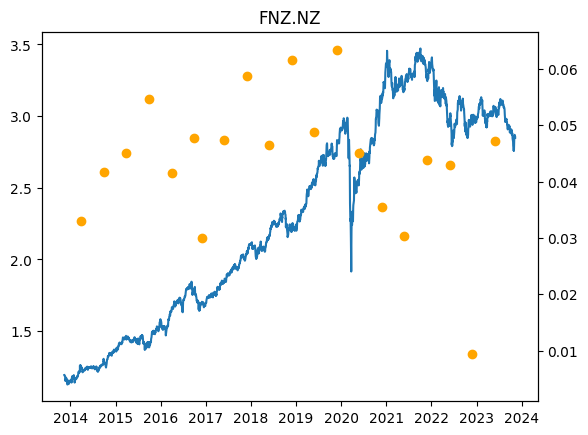

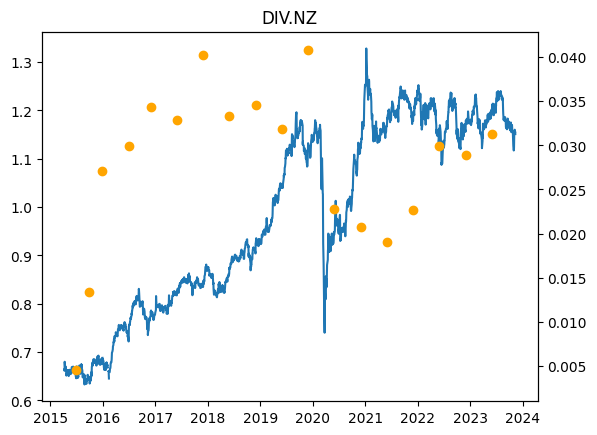

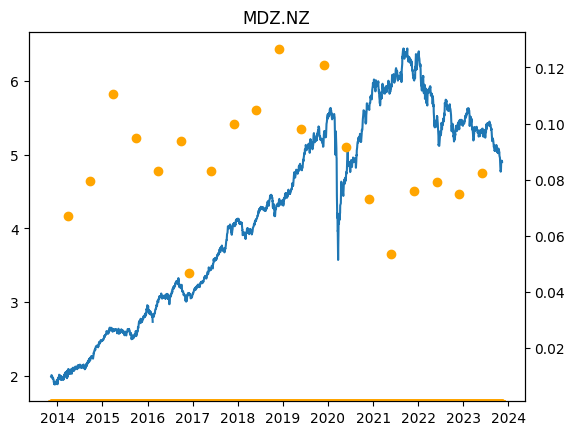

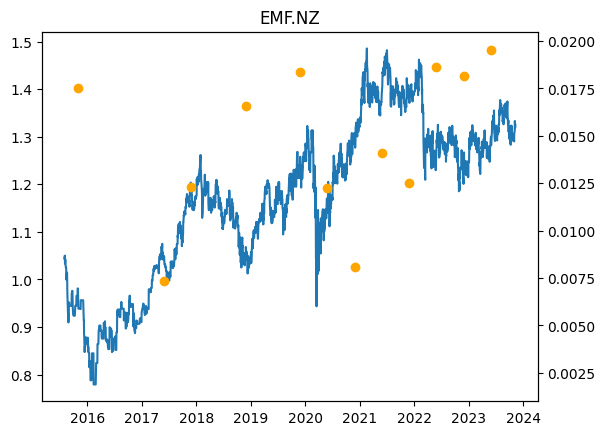

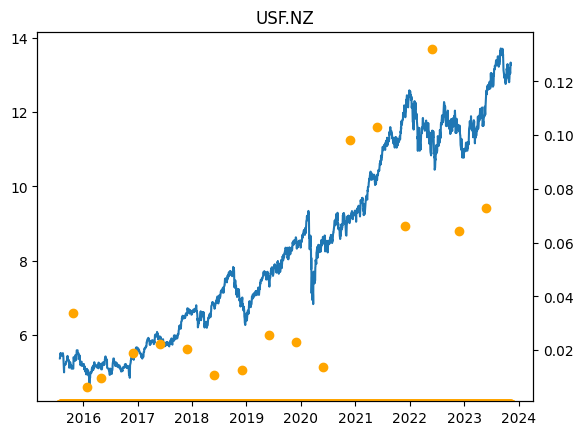

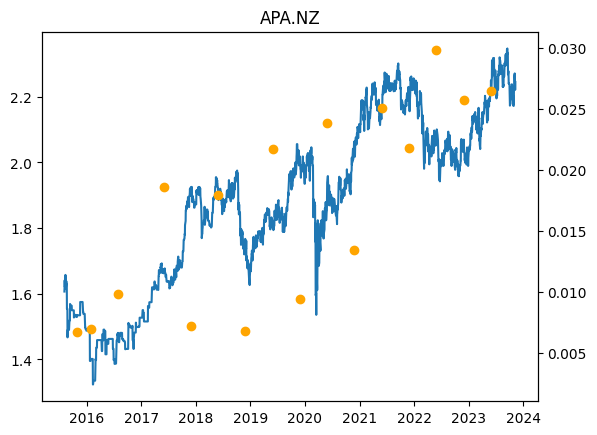

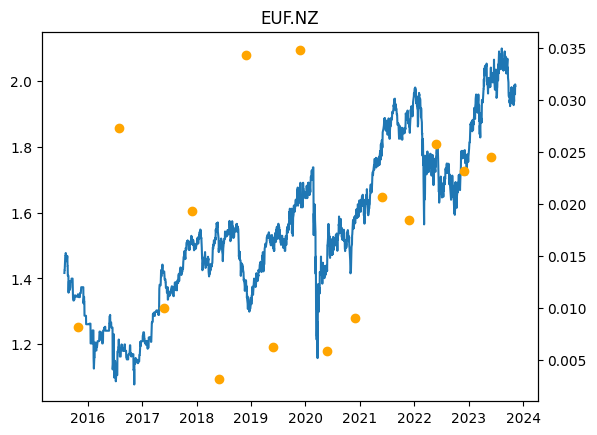

In [4]:
for ticker in tickers:
    fig, ax  = plt.subplots()
    ax.set_title(ticker)
    ax.plot(raw_data[ticker + '_price'])
    ax2 = ax.twinx()
    ax2.plot(raw_data[ticker + '_div'], color='orange', marker='o', linestyle=' ')
    ax2.set_ylim([0.001, None])
    plt.show()

In [5]:
def process_data(df, tickers):
    """
    Process and clean the raw data.
    """
    
    price_cols = [x + '_price' for x in tickers] 
    divy_cols = [x + '_divyield' for x in tickers]

    # Calculate divided yields
    df_copy = df.copy()
    for x in tickers:
        df_copy[x + '_divyield'] = df_copy[x + '_div'] / df_copy[x + '_price']

    # Fill NAs for dividend yields
    df_copy[divy_cols] = df_copy[divy_cols].fillna(0)

    # Calculate daily returns and drop NAs
    df_copy[price_cols] = df_copy[price_cols].pct_change()
    df_copy.dropna(inplace=True)

    # Create output dataframes
    daily_returns = df_copy[price_cols]
    daily_dividend_yields = df_copy[divy_cols]

    daily_returns.columns = tickers
    daily_dividend_yields.columns = tickers

    daily_total_returns = daily_returns + daily_dividend_yields
    
    return daily_returns, daily_dividend_yields, daily_total_returns

daily_returns, daily_dividend_yields, daily_total_returns = process_data(raw_data, tickers)

daily_total_returns.head()

,FNZ.NZ,DIV.NZ,MDZ.NZ,EMF.NZ,USF.NZ,APA.NZ,EUF.NZ
Date,,,,,,,
2015-08-05 00:00:00+12:00,0.005612,0.008000,0.011058,0.000000,0.000000,0.007544,0.000000
2015-08-06 00:00:00+12:00,-0.002029,-0.007937,-0.010090,0.008432,0.000000,0.013643,0.000000
2015-08-07 00:00:00+12:00,-0.003050,-0.003000,0.002261,-0.009197,-0.002857,-0.012162,0.005811
2015-08-10 00:00:00+12:00,-0.005609,-0.006018,-0.010741,-0.007595,-0.009439,0.002990,-0.006932
2015-08-11 00:00:00+12:00,-0.010256,-0.002018,0.000000,0.000000,0.000000,0.019407,0.000000


Portfolio with Highest Sharpe Ratio:
Average Return: 0.13788735939133423
Volatility: 0.11088321402358971
Weights:
FNZ.NZ: 4.56%
DIV.NZ: 52.85%
MDZ.NZ: 24.39%
EMF.NZ: 0.71%
USF.NZ: 12.96%
APA.NZ: 2.27%
EUF.NZ: 2.26%


Portfolio with Minimum Volatility:
Average Return: 0.12262432667097717
Volatility: 0.10520770892703225
Weights:
FNZ.NZ: 15.31%
DIV.NZ: 27.00%
MDZ.NZ: 31.15%
EMF.NZ: 5.02%
USF.NZ: 3.19%
APA.NZ: 17.59%
EUF.NZ: 0.74%




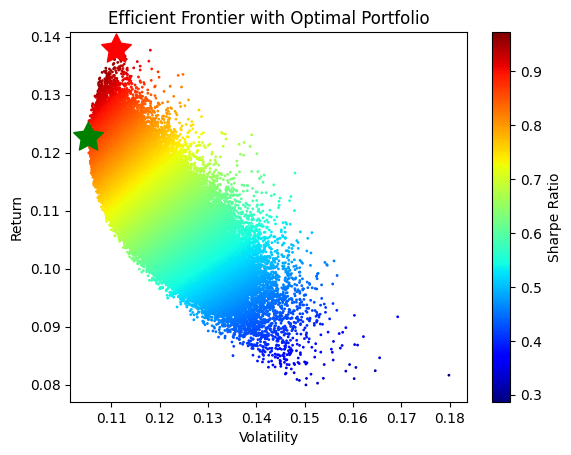

In [21]:
risk_free_rate = 0.03
num_portfolios = 100000
include_dividends_in_returns = True

def generate_portfolios(daily_returns, 
                        daily_dividend_yields, 
                        risk_free_rate=0.0,
                        num_portfolios=25000,
                        include_dividends_in_returns=True
                        ):
    """"
    Generate Portfolios.
    """
    # Annualize the daily returns and dividend yields
    mean_daily_returns = daily_returns.mean()
    if include_dividends_in_returns:
        mean_daily_dividend_yields = daily_dividend_yields.mean()
    else:
        mean_daily_dividend_yields = 0.0
    annual_returns = (1 + mean_daily_returns + mean_daily_dividend_yields).pow(252) - 1

    cov_matrix = daily_returns.cov()

    # Set the number of iterations for the simulation

    num_stocks = len(daily_returns.columns)
    results = np.zeros((3 + num_stocks, num_portfolios))

    for i in range(num_portfolios):
        weights = np.random.random(num_stocks)
        weights /= np.sum(weights)
        
        # Adjusted for dividends
        portfolio_return = np.sum(annual_returns * weights)
        portfolio_stddev = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(252)
        
        results[0,i] = portfolio_return
        results[1,i] = portfolio_stddev
        results[2,i] = (portfolio_return - risk_free_rate) / portfolio_stddev  # Sharpe Ratio
        
        for j in range(len(weights)):
            results[j+3,i] = weights[j]

    columns = ['ret', 'stdev', 'sharpe'] + [ticker + '_weight' for ticker in daily_returns.columns]
    results_df = pd.DataFrame(results.T, columns=columns)

    return results_df

results_df = generate_portfolios(daily_returns, 
                                    daily_dividend_yields, 
                                    risk_free_rate=risk_free_rate,
                                    num_portfolios=num_portfolios,
                                    include_dividends_in_returns=include_dividends_in_returns)

def get_optimal_portfolios(results_df):
    """
    Find the portfolio with the highest Sharpe Ratio and minimum standard deviation
    """
    max_sharpe_port = results_df.iloc[results_df['sharpe'].idxmax()]
    min_vol_port = results_df.iloc[results_df['stdev'].idxmin()]

    return max_sharpe_port, min_vol_port

max_sharpe_port, min_vol_port = get_optimal_portfolios(results_df)

# Print details of the optimal portfolio
print("Portfolio with Highest Sharpe Ratio:")
print("Average Return:", max_sharpe_port['ret'])
print("Volatility:", max_sharpe_port['stdev'])
print("Weights:")
for ticker in tickers:
    print(f"{ticker}: {max_sharpe_port[ticker + '_weight']*100:.2f}%")
print("\n")

# Print details of the minimum volatility portfolio
print("Portfolio with Minimum Volatility:")
print("Average Return:", min_vol_port['ret'])
print("Volatility:", min_vol_port['stdev'])
print("Weights:")
for ticker in tickers:
    print(f"{ticker}: {min_vol_port[ticker + '_weight']*100:.2f}%")
print("\n")

# Plotting the efficient frontier and the two special portfolios
plt.scatter(results_df.stdev, results_df.ret, c=results_df.sharpe, cmap='jet', s=1.0)
plt.title('Efficient Frontier with Optimal Portfolio')
plt.xlabel('Volatility')
plt.ylabel('Return')
plt.colorbar(label='Sharpe Ratio')
plt.scatter(max_sharpe_port[1], max_sharpe_port[0], marker=(5,1,0), color='r', s=500)
plt.scatter(min_vol_port[1], min_vol_port[0], marker=(5,1,0), color='g', s=500)
plt.show()


In [22]:
# Scatter plot of the efficient frontier
fig = px.scatter(results_df, x='stdev', y='ret', color='sharpe',
                 color_continuous_scale='Jet', title='Efficient Frontier with Optimal Portfolio')

# Add marker for the portfolio with the highest Sharpe Ratio
fig.add_trace(go.Scatter(x=[max_sharpe_port['stdev']], y=[max_sharpe_port['ret']],
                         mode='markers', marker=dict(color='red', size=15),
                         name='Max Sharpe Ratio'))

# Add marker for the portfolio with minimum volatility
fig.add_trace(go.Scatter(x=[min_vol_port['stdev']], y=[min_vol_port['ret']],
                         mode='markers', marker=dict(color='green', size=15),
                         name='Min Volatility'))

# Update layout for labels and title
fig.update_layout(width=800, height=600, xaxis_title='Volatility', yaxis_title='Return',
                  coloraxis_colorbar=dict(title='Sharpe Ratio'))

# Show the plot
fig.show()


In [25]:
# Scatter plot of the efficient frontier
fig = px.scatter(results_df, x='stdev', y='ret', color='sharpe',
                 color_continuous_scale='Jet', title='Efficient Frontier with Optimal Portfolio')

# Add marker for the portfolio with the highest Sharpe Ratio
fig.add_trace(go.Scatter(x=[max_sharpe_port['stdev']], y=[max_sharpe_port['ret']],
                         mode='markers+text', text=["Max Sharpe Ratio"], textposition="top center",
                         marker=dict(color='red', size=20, line=dict(width=2, color='DarkSlateGrey')),
                         name='Max Sharpe Ratio'))

# Add marker for the portfolio with minimum volatility
fig.add_trace(go.Scatter(x=[min_vol_port['stdev']], y=[min_vol_port['ret']],
                         mode='markers+text', text=["Min Volatility"], textposition="bottom center",
                         marker=dict(color='green', size=20, line=dict(width=2, color='DarkSlateGrey')),
                         name='Min Volatility'))

# Update layout for labels and title
fig.update_layout(width=800, height=600, xaxis_title='Volatility', yaxis_title='Return',
                  coloraxis_colorbar=dict(title='Sharpe Ratio'))

# Show the plot
fig.show()


In [92]:
risk_free_rate = 0.0
num_portfolios = 10000
base_value = 100
include_dividends_in_returns = True

daily_returns, daily_dividend_yields, daily_total_returns = process_data(raw_data, tickers)

def backtest_portfolio_optimisation(tickers,
                                    daily_returns, 
                                    daily_dividend_yields,
                                    risk_free_rate,
                                    num_portfolios,
                                    include_dividends_in_returns,
                                    use_prev_year=True):
    """
    Backtest portfolio optimisation.
    """

    # Lists to store the optimal portfolio returns after rebalancing
    max_sharpe_returns = []
    min_vol_returns = []
    max_sharpe_weights_dict = defaultdict(list)

    # Init dates
    start_date = min(daily_returns.index).strftime('%Y-%m-%d')
    year_next = int(min(daily_returns.index).strftime('%Y')) + 1
    year_max = int(max(daily_returns.index).strftime('%Y'))
    first_start_date = None

    counter = 0
    while year_next <= year_max + 1:
        if counter == 1:
            first_start_date = start_date
        end_date = f'{year_next}-03-31'
        print(start_date, end_date)

        # Select rows between two dates
        daily_returns_ = daily_returns[(daily_returns.index>= start_date) & (daily_returns.index <= end_date)]
        daily_dividend_yields_ = daily_dividend_yields[(daily_dividend_yields.index>= start_date) & (daily_dividend_yields.index <= end_date)]

        if use_prev_year:
            results_df = generate_portfolios(daily_returns_, 
                                            daily_dividend_yields_, 
                                            risk_free_rate=risk_free_rate,
                                            num_portfolios=num_portfolios,
                                            include_dividends_in_returns=include_dividends_in_returns
                                            )
        else:
            daily_returns_cum = daily_returns[daily_returns.index <= end_date]
            daily_dividend_yields_cum = daily_dividend_yields[daily_dividend_yields.index <= end_date]
            results_df = generate_portfolios(daily_returns_cum, 
                                daily_dividend_yields_cum, 
                                risk_free_rate=risk_free_rate,
                                num_portfolios=num_portfolios,
                                include_dividends_in_returns=include_dividends_in_returns
                                )    
            
        max_sharpe_port, min_vol_port = get_optimal_portfolios(results_df)

        if counter > 0:
            max_sharpe_weighted_daily_returns = list(np.sum(daily_returns_.values * max_sharpe_weights, axis=1))
            min_vol_weighted_daily_returns = list(np.sum(daily_returns_.values * min_vol_weights, axis=1))
            max_sharpe_returns.extend(max_sharpe_weighted_daily_returns)
            min_vol_returns.extend(min_vol_weighted_daily_returns)

            max_sharpe_weights_dict['date'].append(start_date)
            for x in tickers:
                max_sharpe_weights_dict[re.split(r'[._]', x)[0]].append(max_sharpe_port[x + '_weight'])

        # Update weights
        max_sharpe_weights = max_sharpe_port[[x + '_weight' for x in tickers]].values
        min_vol_weights = min_vol_port[[x + '_weight' for x in tickers]].values

        # Update dates
        counter += 1
        start_date = f'{year_next}-04-01'
        year_next += 1

    # Create dataframe of weights as portfolio is rebalanced over time
    max_sharpe_weights_df = pd.DataFrame(max_sharpe_weights_dict).round(2)

    return max_sharpe_returns, min_vol_returns, max_sharpe_weights_df, first_start_date

max_sharpe_returns, \
min_vol_returns,  \
max_sharpe_weights_df, \
first_start_date = backtest_portfolio_optimisation(
                                                tickers,
                                                daily_returns, 
                                                daily_dividend_yields,
                                                risk_free_rate,
                                                num_portfolios,
                                                include_dividends_in_returns)

2015-08-05 2016-03-31
2016-04-01 2017-03-31
2017-04-01 2018-03-31
2018-04-01 2019-03-31
2019-04-01 2020-03-31
2020-04-01 2021-03-31
2021-04-01 2022-03-31
2022-04-01 2023-03-31
2023-04-01 2024-03-31


In [93]:
max_sharpe_weights_df

,date,FNZ,DIV,MDZ,EMF,USF,APA,EUF
0,2016-04-01,0.04,0.40,0.20,0.07,0.01,0.22,0.05
1,2017-04-01,0.36,0.07,0.37,0.01,0.04,0.08,0.06
2,2018-04-01,0.27,0.34,0.30,0.01,0.03,0.03,0.02
3,2019-04-01,0.13,0.03,0.04,0.06,0.64,0.09,0.01
4,2020-04-01,0.15,0.11,0.52,0.04,0.15,0.00,0.04
5,2021-04-01,0.01,0.18,0.08,0.02,0.48,0.08,0.15
6,2022-04-01,0.08,0.03,0.03,0.09,0.06,0.22,0.49
7,2023-04-01,0.02,0.19,0.01,0.24,0.53,0.01,0.01


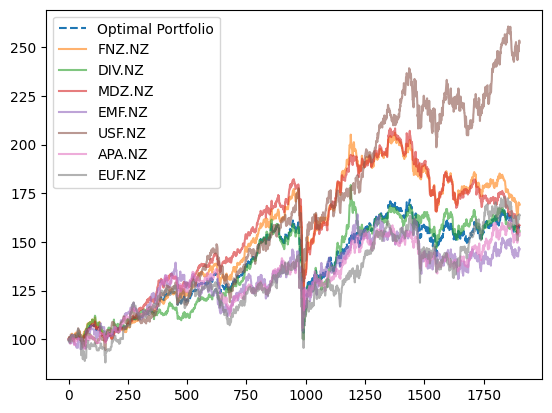

In [24]:
daily_returns_ = daily_returns[(daily_returns.index>=first_start_date)]
optimal_portfolio_returns_np = np.array(optimal_portfolio_returns)
multiplicative_returns = 1.0 + optimal_portfolio_returns_np
cumulative_returns = np.cumprod(multiplicative_returns)
# Apply cumulative returns to base value
final_values = base_value * cumulative_returns
     
# Plot the cumulative gains
plt.figure()
plt.plot(final_values, label='Optimal Portfolio', linestyle='dashed')

for col in daily_returns.columns:
    multiplicative_returns = 1 + daily_returns_[col].values
    cumulative_returns = np.cumprod(multiplicative_returns)
    # Apply cumulative returns to base value
    final_values = base_value * cumulative_returns
    plt.plot(final_values, label=col, alpha=0.6)

plt.legend()
plt.show()

In [76]:
max_sharpe_port_data = max_sharpe_port.to_frame().T.round(2).reset_index(drop=True)
max_sharpe_port_data.insert(0, 'portfolio', 'max sharpe')
max_sharpe_port_data.columns = [x.split('.')[0] for x in max_sharpe_port_data.columns.to_list()]

min_vol_port_data = min_vol_port.to_frame().T.round(2).reset_index(drop=True)
min_vol_port_data.insert(0, 'portfolio', 'min volatility')
min_vol_port_data.columns = [x.split('.')[0] for x in min_vol_port_data.columns.to_list()]

combined_data = pd.concat([max_sharpe_port_data, min_vol_port_data])
combined_data = combined_data.to_dict(orient='records')
combined_data

[{'portfolio': 'max sharpe',
  'ret': 0.14,
  'stdev': 0.11,
  'sharpe': 0.97,
  'FNZ': 0.05,
  'DIV': 0.53,
  'MDZ': 0.24,
  'EMF': 0.01,
  'USF': 0.13,
  'APA': 0.02,
  'EUF': 0.02},
 {'portfolio': 'min volatility',
  'ret': 0.12,
  'stdev': 0.11,
  'sharpe': 0.88,
  'FNZ': 0.15,
  'DIV': 0.27,
  'MDZ': 0.31,
  'EMF': 0.05,
  'USF': 0.03,
  'APA': 0.18,
  'EUF': 0.01}]